# Stable Diffusion XL with Azure Machine Learning

<img src="../media/sdxl.png" alt="Alt Text" width="1000"/>

This notebook has been developed and tested on an Azure ML `STANDARD_NC12S_V3` Compute Instance using the `Python 3.10 - SDK v2` Jupyter kernel.

__In this notebook:__
- Prompt based image generation with the SDXL base model an refiner
- Inpainting with the SDXL base model and refiner
- Prompt based variations of existing images
- Deploy SDXL to an Azure ML Online Endpoint __(work in progress)__

__Resources__:  
- https://ngwaifoong92.medium.com/introduction-to-stable-diffusion-xl-0-9-b7b5bbc8e0e8
- https://huggingface.co/docs/diffusers/api/pipelines/stable_diffusion/stable_diffusion_xl

## Setup

In [1]:
# Uncomment to install required packages
# %pip install -U diffusers transformers accelerate safetensors huggingface_hub azure-ai-vision ipywidgets

In [2]:
from diffusers import StableDiffusionXLPipeline, StableDiffusionXLImg2ImgPipeline, StableDiffusionXLInpaintPipeline
from diffusers.utils import load_image

import numpy as np
import torch
import os
import glob
import re

from PIL import Image, ImageOps
import matplotlib.pyplot as plt

## Helper function

In [3]:
def show_images_side_by_side(images, titles=None, rows=1):
    num_images = len(images)
    cols = num_images // rows + (num_images % rows > 0)
    plt.figure(figsize=(20,10)) # You can adjust the figure size as per your requirement

    for i, image in enumerate(images):
        plt.subplot(rows,cols,i+1) # "rows,cols,i+1" means: in a grid rows x cols, put this in the i+1 slot
        plt.imshow(image)
        if titles is not None:
            plt.title(titles[i])
        plt.axis('off')   # Turn off axis numbers and ticks

    plt.tight_layout()
    plt.show()

## Prompt based image generation with the SDXL base Model an Refiner
Besides the primary model checkpoint, StableDiffusion-XL comes with a specialized refiner checkpoint designed to denoise images in the low-noise stage, thereby enhancing their high-frequency quality. This refiner checkpoint can be utilized as a subsequent stage in the pipeline after employing the base checkpoint, providing an upgrade to the overall image quality.

You can compare the results by using the `use_refiner` parameter of the `create_sdxl_image` function. For side-by-side comparison, you need to use the identical seed for both generation processes.

In [4]:
base = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True)
base.enable_model_cpu_offload()

refiner = StableDiffusionXLImg2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0",
    text_encoder_2=base.text_encoder_2,
    vae=base.vae,
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16",
)
refiner.enable_model_cpu_offload()

def create_sdxl_image(prompt, negative_prompt= None, use_refiner=True, seed=None, n_steps= 50, **kwargs):
    """
    Creates an image using the StableDiffusionXLPipeline.

    Args:
        prompt (str): The text prompt to generate an image from.
        negative_prompt (str, optional): The text prompt to avoid when generating the image. Defaults to None.
        use_refiner (bool, optional): Determines whether to use the refiner or not. Defaults to True.
        seed (int, optional): The random seed used for generating the image. Defaults to None.
        n_steps (int, optional): The number of steps to take when creating the image. Defaults to 40.
        **kwargs: Additional keyword arguments for the StableDiffusionXLPipeline.

    Returns:
        PIL.Image: The generated image.

    Note:
        This function uses the StableDiffusionXLPipeline to create an image based on the given text prompt. 
        It can optionally use a refiner for better image quality and can be set to avoid certain themes by 
        using a negative prompt. A random seed can be specified for reproducibility.
    """

    high_noise_frac = 0.7

    if seed:
        generator = torch.Generator(device="cuda").manual_seed(seed)
    else:
        generator = None
    
    image = base(prompt= prompt, 
                num_inference_steps= n_steps,
                denoising_end= high_noise_frac if use_refiner else 1.0,
                output_type= "latent" if use_refiner else "pil",
                generator= generator,
                **kwargs).images[0]

    if use_refiner:
        image = refiner(prompt=prompt, 
                        num_inference_steps= n_steps,
                        denoising_start = high_noise_frac,
                        image=image[None, :], 
                        generator= generator).images[0]

    return image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

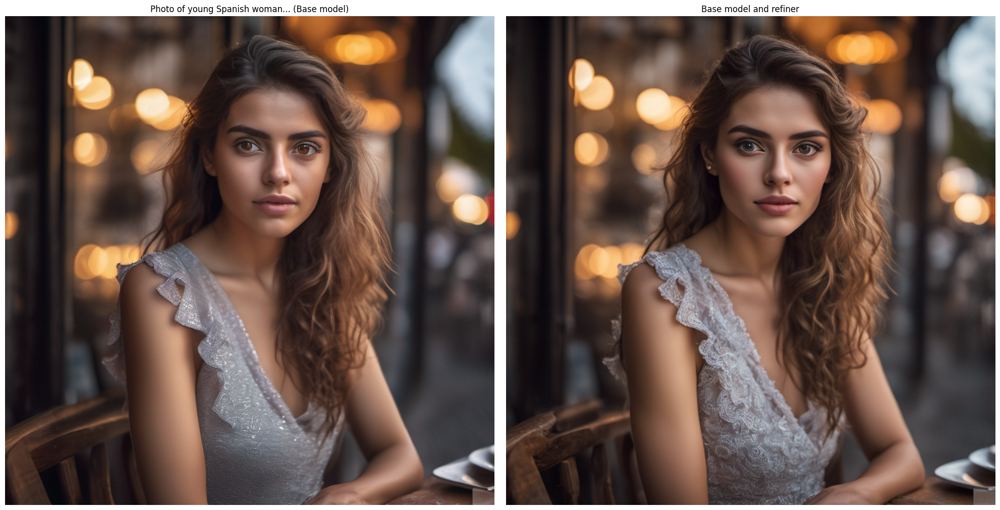

In [5]:
prompt = "Photo of young Spanish woman, highlight hair, sitting outside restaurant, wearing dress, rim lighting, studio lighting, looking at the camera, dslr, ultra quality, sharp focus, tack sharp, dof, film grain, Fujifilm XT3, crystal clear, 8K UHD, highly detailed glossy eyes, high detailed skin, skin pores"
negative_prompt = "disfigured, ugly, bad, immature, cartoon, anime, 3d, painting, b&w"
seed = 2

image = create_sdxl_image(prompt, negative_prompt, use_refiner=False, seed= seed)
refined = create_sdxl_image(prompt, negative_prompt, seed= seed)

scene = prompt.split(',')[0]+ '...'

show_images_side_by_side([image, refined], [f'{scene} (Base model)', 'Base model and refiner'])

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/15 [00:00<?, ?it/s]

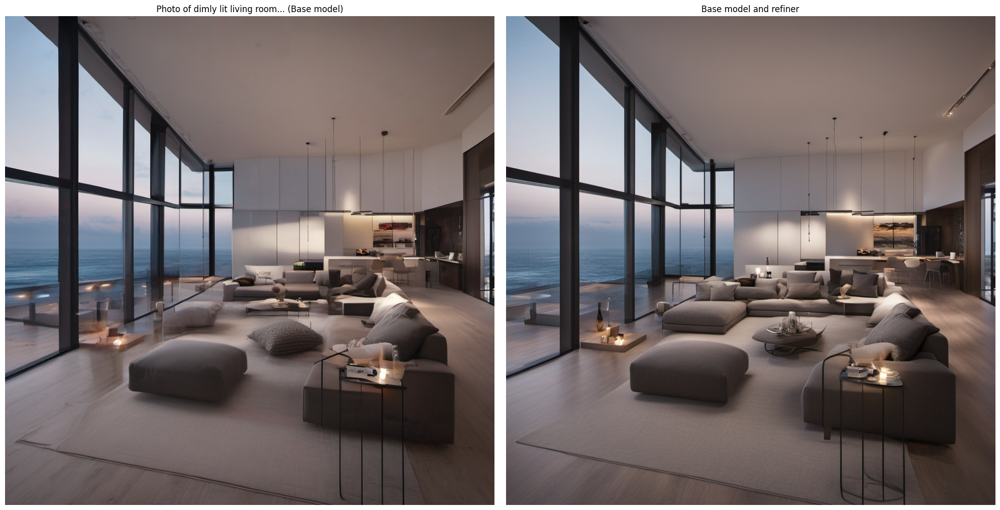

In [6]:
prompt = "Photo of dimly lit living room, minimalist furniture, huge room, floor to ceiling window with an ocean view, nighttime"
negative_prompt = None
seed = 8

image = create_sdxl_image(prompt, negative_prompt, use_refiner=False, seed= seed)
refined = create_sdxl_image(prompt, negative_prompt, seed= seed)

scene = prompt.split(',')[0]+ '...'

show_images_side_by_side([image, refined], [f'{scene} (Base model)', 'Base model and refiner'])

## Inpainting with the SDXL base model and refiner
Stable Diffusion XL also enables inpainting based on an existing image, a mask image that defines the area to be inpainted and a prompt. You can optionally use the refiner to improve the inpainting result.

In [7]:
base = StableDiffusionXLInpaintPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, variant="fp16", use_safetensors=True)
base.enable_model_cpu_offload()

refiner = StableDiffusionXLInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0",
    text_encoder_2=base.text_encoder_2,
    vae=base.vae,
    torch_dtype=torch.float16,
    use_safetensors=True,
    variant="fp16",
)

refiner.enable_model_cpu_offload()

def inpaint(init_image, mask_image, prompt, negative_prompt= None, use_refiner=True, seed=None, n_steps= 50, **kwargs):
    """
    Performs inpainting of an image using the StableDiffusionXLInpaintPipeline.

    Args:
        init_image (torch.Tensor): The initial image to start the inpainting process.
        mask_image (torch.Tensor): The mask image indicating the area to inpaint.
        prompt (str): The text prompt to guide the inpainting process.
        negative_prompt (str, optional): The text prompt to avoid when inpainting. Defaults to None.
        use_refiner (bool, optional): Determines whether to use the refiner or not. Defaults to True.
        seed (int, optional): The random seed used for generating the image. Defaults to None.
        n_steps (int, optional): The number of steps to take when inpainting the image. Defaults to 50.
        **kwargs: Additional keyword arguments for the StableDiffusionXLInpaintPipeline.

    Returns:
        PIL.Image: The inpainted image.

    Note:
        This function uses the StableDiffusionXLInpaintPipeline to inpaint an image based on the given text prompt. 
        It can optionally use a refiner for better image quality and can be set to avoid certain themes by 
        using a negative prompt. A random seed can be specified for reproducibility.
    """

    high_noise_frac = 0.7

    if seed:
        generator = torch.Generator(device="cuda").manual_seed(seed)
    else:
        generator = None
    
    image = base(prompt= prompt,
                negative_prompt= negative_prompt,
                image=init_image,
                mask_image=mask_image, 
                num_inference_steps= n_steps,
                strength=0.8,
                denoising_end= high_noise_frac if use_refiner else 1.0,
                output_type= "latent" if use_refiner else "pil",
                generator= generator,
                **kwargs).images[0]

    if use_refiner:
        image = refiner(prompt=prompt,
                        negative_prompt= negative_prompt,
                        mask_image=mask_image,  
                        num_inference_steps= n_steps,
                        denoising_start = high_noise_frac,
                        image=image[None, :], 
                        generator= generator).images[0]

    return image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

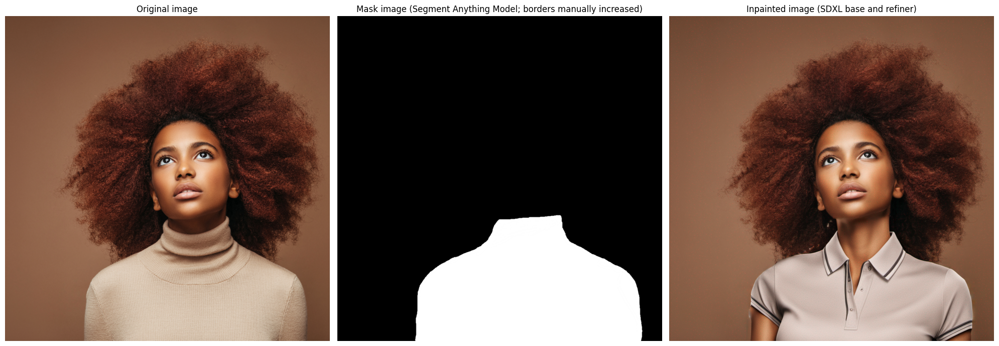

In [8]:
img_url = "./no-smile-1024.png"
mask_url = "./no-smile-big-mask.png"

init_image = Image.open(img_url)
mask_image = Image.open(mask_url)

prompt = "women summer polo-shirt, detailed, photorealistic, professional fashion photo shooting, fashion magazine"
negative_prompt = 'deformed, disfigured, underexposed, overexposed'

refined = inpaint(init_image, mask_image, prompt, negative_prompt, use_refiner=True, seed=2, n_steps=90)

show_images_side_by_side([init_image, mask_image, refined], ["Original image", "Mask image (Segment Anything Model; borders manually increased)", "Inpainted image (SDXL base and refiner)"])

### Comparison: Stable Diffusion 2 Inpainting
Above results are not perfect. We can see a few artifacts even after manually adjusting the mask image. We are now using the Stable Diffusion 2 inpainting model with original mask (generated by Meta's Segment Anythin Model, SAM) for comparison.

text_encoder/model.safetensors not found


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

/anaconda/envs/azureml_py310_sdkv2/lib/python3.10/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


  0%|          | 0/50 [00:00<?, ?it/s]

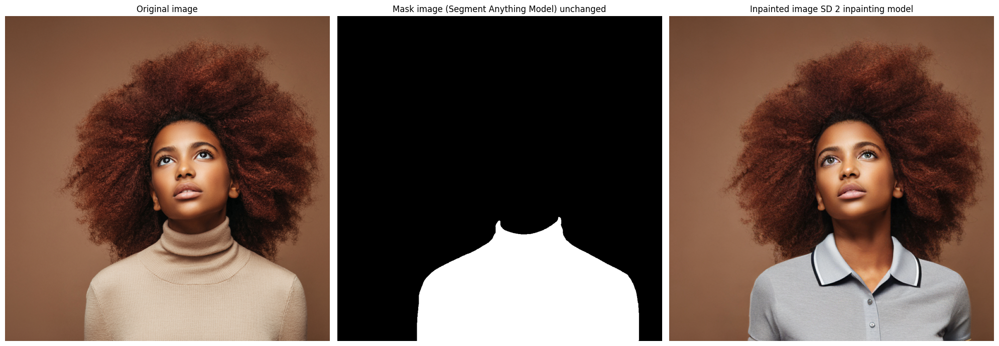

In [9]:
from diffusers import StableDiffusionInpaintPipeline
from PIL import ImageOps

img_url = "./no-smile-1024.png"
mask_url = "./no-smile-mask.png"

init_image = Image.open(img_url)
mask_image = Image.open(mask_url)
inv_mask = mask_image.split()[3]
mask = ImageOps.invert(inv_mask)

sd2_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-inpainting", # options: runwayml/stable-diffusion-inpainting, stabilityai/stable-diffusion-2-inpainting
    revision="fp16",
    torch_dtype=torch.float16,
).to('cuda')

prompt = "women summer polo-shirt, detailed, photorealistic, professional fashion photo shooting, fashion magazine"
negative_prompt = 'deformed, disfigured, underexposed, overexposed'

seed = 6 

if seed:
    generator = torch.Generator(device="cuda").manual_seed(seed)
else:
    generator = None


result = sd2_pipe(prompt=prompt,
                  negative_prompt= negative_prompt, 
                  image=init_image,
                  mask_image=mask,
                  num_images_per_prompt=1,
                  generator= generator
                  )

print("")
show_images_side_by_side([init_image, mask_image, result.images[0]], ["Original image", "Mask image (Segment Anything Model) unchanged", "Inpainted image SD 2 inpainting model"])

## Prompt based variations of existing images
### Simulate aging based on an original image and a prompt

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

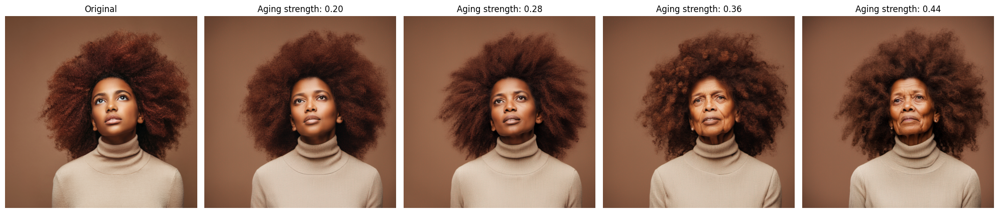

In [10]:
init_image = load_image("./no-smile-1024.png").convert("RGB")

prompt = "old woman"
seed = 12345

if seed:
    generator = torch.Generator(device="cuda").manual_seed(seed)
else:
    generator = None

refiner = StableDiffusionXLImg2ImgPipeline.from_pretrained("stabilityai/stable-diffusion-xl-refiner-1.0", 
                                                           torch_dtype=torch.float16, 
                                                           use_safetensors=True, 
                                                           variant="fp16")
refiner.enable_model_cpu_offload()

strengths = np.arange(0.2, 0.5, 0.08)

old_images = []

for strength in strengths:
    
    refined_image = refiner(prompt=prompt,
                            num_inference_steps= 50,
                            strength= strength,
                            image= init_image, 
                            generator=generator).images[0]

    old_images.append(refined_image)

old_strengths = [f'Aging strength: {strength:.2f}' for strength in strengths]
show_images_side_by_side([init_image, *old_images], ['Original', *old_strengths])

### Simulate rejuvenation

In [11]:
prompt = "young girl"
strengths = np.arange(0.2, 0.5, 0.08)

young_images = []

for strength in strengths:
    
    refined_image = refiner(prompt=prompt,
                            num_inference_steps= 50,
                            strength= strength,
                            image= init_image, 
                            generator=generator).images[0]

    young_images.append(refined_image)

young_strengths = [f'Rejuvenate strength: {strength:.2f}' for strength in strengths]
show_images_side_by_side([init_image, *young_images], ['Original', *young_strengths])

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/22 [00:00<?, ?it/s]

### Combining images for a simulated journey from young to old

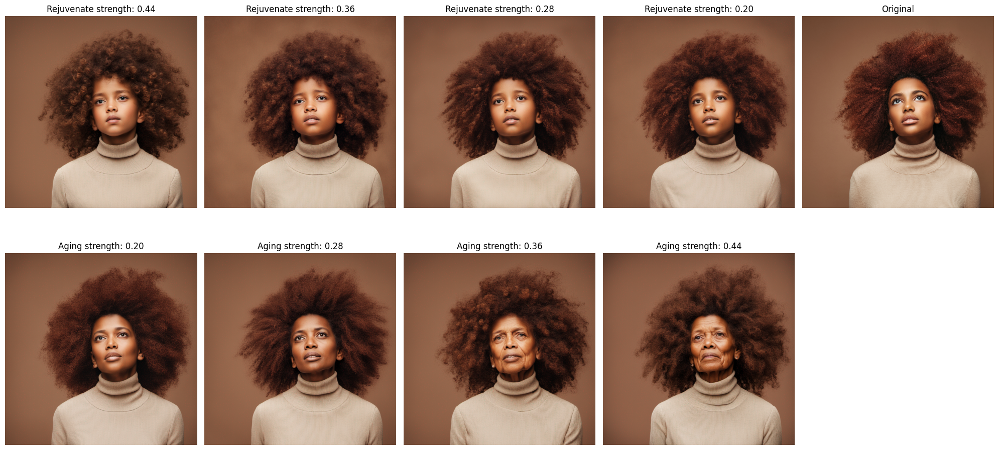

In [12]:
lifecycle_images = [*young_images[::-1], init_image, *old_images]
lifecycle_titles = [*young_strengths[::-1], "Original", *old_strengths]

show_images_side_by_side(lifecycle_images, lifecycle_titles, rows=2)